### En este cuaderno se lleva a cabo el desarrollo de la combinación del recorte previo con la aplicación del modelo con SAHI

#### Parte 1 - Prerecorte del telefono
Con objetivo de eliminar la mayor parte posible del fondo se identifica la clase telefono y se hace un recorte previo

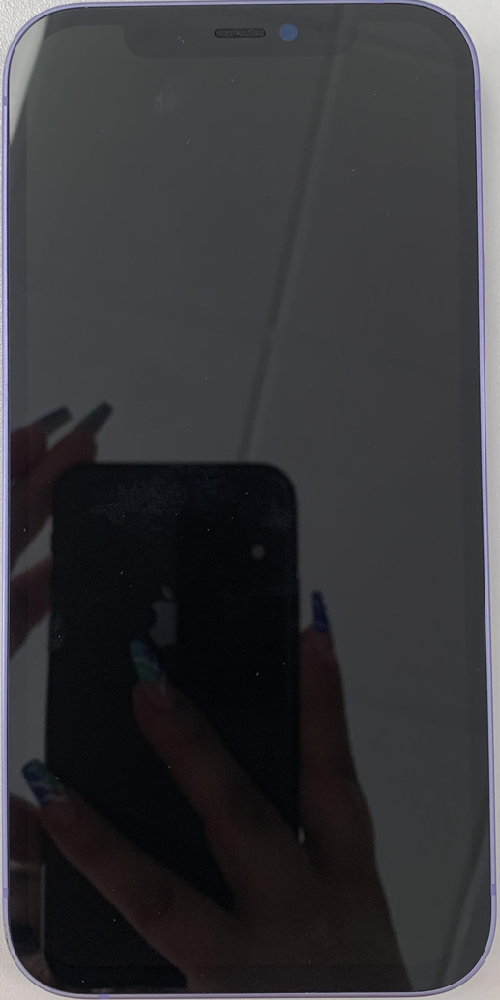

In [1]:
from ultralytics import YOLO
import cv2
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

#Se declara el modelo
model = YOLO ('/home/ana/TFM/modelos/pre-crop-cell-phone/weights/best.pt')

#ruta a la imagen
img_path = '/home/ana/TFM/datasets/dataset_previa/desperfectos_moviles_reduccion_clases.v1i.yolov9/test/images/IMG_0001-3-_png.rf.929b8b12404c6e6dfc6a0bc00dcd0bb7.jpg'

#carga de la imagen
img = Image.open (img_path)

#inferencia del modelo sobre la imagen
results = model(img, verbose = False)

for result in results:
    boxes = result.boxes.cpu().numpy().xyxy
    classes = result.boxes.cpu().numpy().cls
    names = result.names
    for box, cls in zip(boxes, classes):
        if names[cls] == "cell phone":  # Suponiendo que 'cls' contiene el nombre de la clase
            #print('detecto cell phone')
            crop = img.crop((box[0], box[1], box[2], box[3]))
            new_size = (int(crop.size[0] / 3), int(crop.size[1] / 3))
            crop_resized = crop.resize(new_size)
            display(crop_resized)

In [5]:
from PIL import Image
import numpy as np

image_array = np.array(crop)

#### Parte 2 - Aplicar el modelo con SAHI
Dado el tamaño reducido de las etiquetas es necesario aplicar SAHI, además el modelo ha sido entrenado con imágenes recortadas aplicando el concepto de SAHI

In [8]:
from ultralytics import  RTDETR
from pathlib import Path
from IPython.display import Image

from sahi.utils.rtdetr import (
    download_rtdetrl_model
)

from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

#carga del modelo de detección de desperfectos - RTDETR
modelo_desperfectos = RTDETR ('/home/ana/TFM/modelos/experimento_4_ampliado/weights/best.pt')


detection_model = AutoDetectionModel.from_pretrained(
    model_type='rtdetr',
    model_path='/home/ana/TFM/modelos/experimento_4_ampliado/weights/best.pt',
    confidence_threshold=0.3,
    device='cuda:0',
)

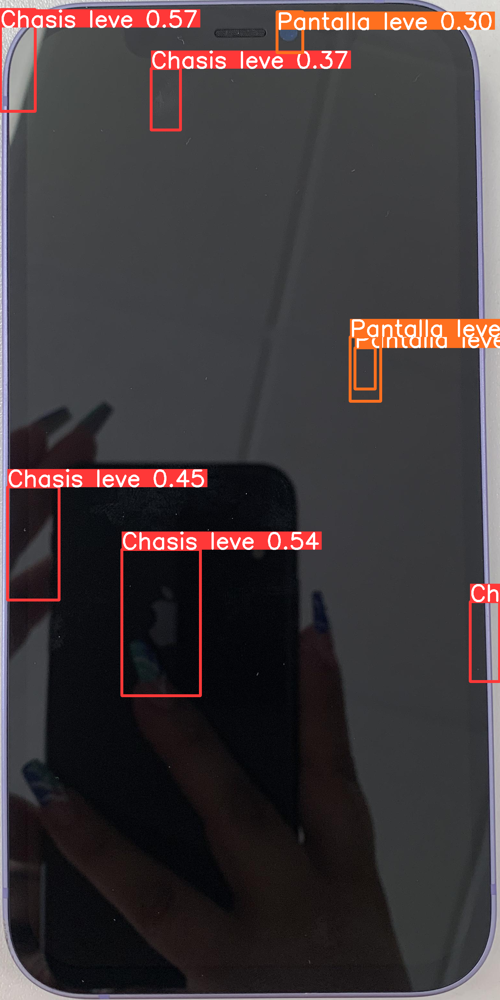

In [9]:
result = get_prediction(image_array, detection_model)

result.export_visuals(export_dir="demo_data/")

Image("demo_data/prediction_visual.png")

Performing prediction on 450 slices.


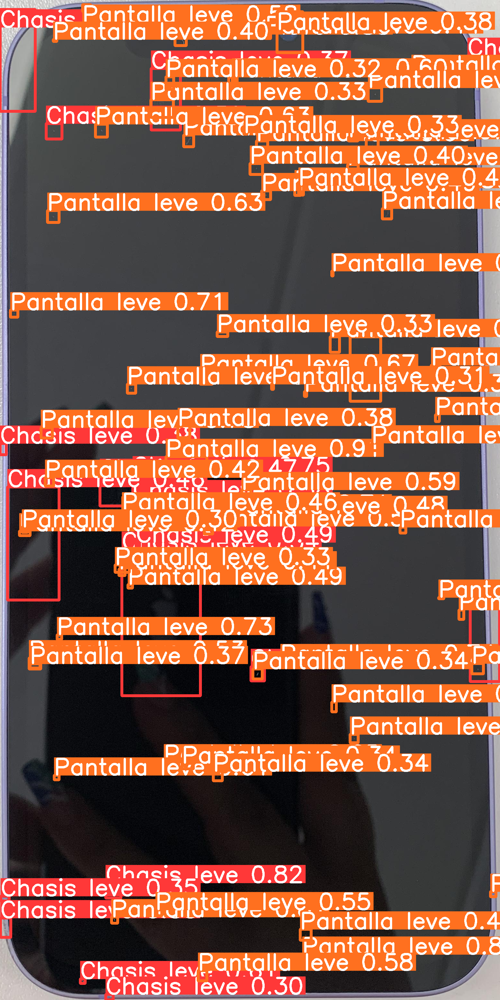

In [10]:
result = get_sliced_prediction(
    image_array,
    detection_model,
    slice_height = 128,
    slice_width = 128,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)

result.export_visuals(export_dir="demo_data/")

Image("demo_data/prediction_visual.png")

#### Parte 3  - Evaluación - COCO Métricas

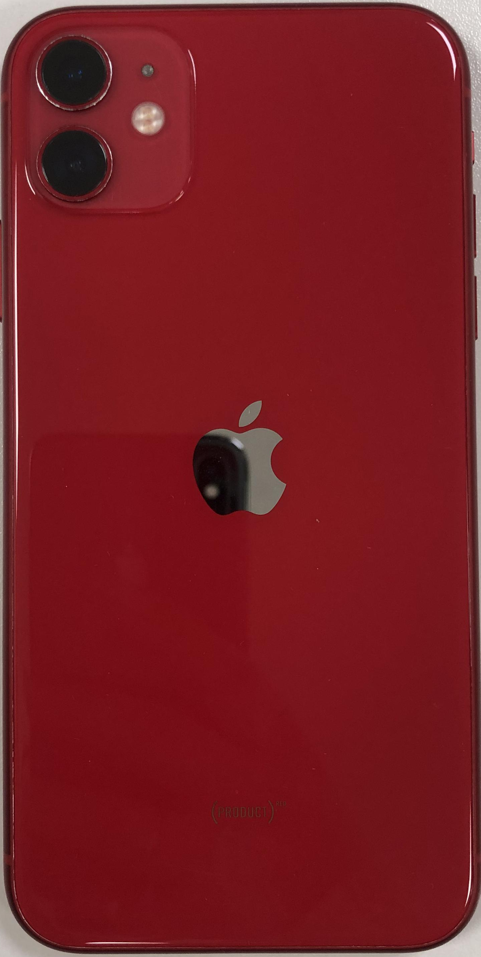

Performing prediction on 392 slices.


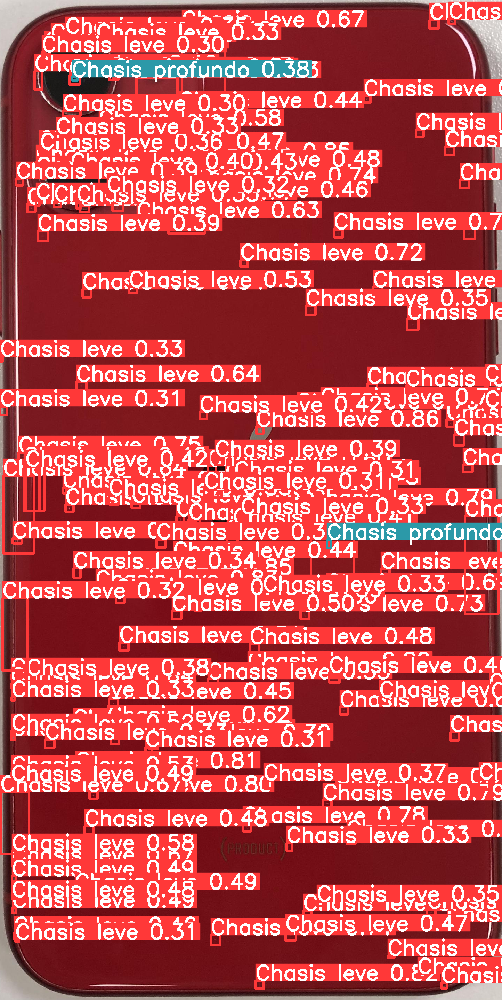

In [17]:
from ultralytics import YOLO
import cv2
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

#Se declara el modelo
model = YOLO ('/home/ana/TFM/modelos/pre-crop-cell-phone/weights/best.pt')

#ruta a la imagen
img_path = '/home/ana/TFM/datasets/dataset_previa/desperfectos_moviles_reduccion_clases.v1i.coco/test/IMG_0193-1-_png.rf.d818bf82ee9f75efb1cba57270be097a.jpg'
#carga de la imagen
img = Image.open (img_path)

#inferencia del modelo sobre la imagen
results = model(img, verbose = False)

for result in results:
    boxes = result.boxes.cpu().numpy().xyxy
    classes = result.boxes.cpu().numpy().cls
    names = result.names
    for box, cls in zip(boxes, classes):
        if names[cls] == "cell phone":  # Suponiendo que 'cls' contiene el nombre de la clase
            #print('detecto cell phone')
            crop = img.crop((box[0], box[1], box[2], box[3]))
            new_size = (int(crop.size[0] / 3), int(crop.size[1] / 3))
            crop_resized = crop.resize(new_size)
            display(crop_resized)


from PIL import Image
import numpy as np

image_array = np.array(crop)

from ultralytics import  RTDETR
from pathlib import Path
from IPython.display import Image

from sahi.utils.rtdetr import (
    download_rtdetrl_model
)

from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

#carga del modelo de detección de desperfectos - RTDETR
modelo_desperfectos = RTDETR ('/home/ana/TFM/modelos/experimento_4_ampliado/weights/best.pt')


detection_model = AutoDetectionModel.from_pretrained(
    model_type='rtdetr',
    model_path='/home/ana/TFM/modelos/experimento_4_ampliado/weights/best.pt',
    confidence_threshold=0.3,
    device='cuda:0',
)

result = get_sliced_prediction(
    image_array,
    detection_model,
    slice_height = 128,
    slice_width = 128,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)

label = result.to_coco_predictions(image_id=1)

#result.export_visuals(export_dir="demo_data/")
#Image("demo_data/prediction_visual.png")
            

In [5]:
#Sahi prediccion por lotes
model_type = "rtdetr"
model_path = '/home/ana/TFM/modelos/experimento_4_ampliado/weights/best.pt'
model_device = 'cuda:0'
model_confidence_threshold = 0.4

slice_height = 128
slice_width = 128
overlap_height_ratio = 0.2
overlap_width_ratio = 0.2

source_image_dir = '/home/ana/TFM/datasets/dataset_cropped/dataset_precrop_coco/test'

In [6]:
predict(
    model_type=model_type,
    model_path=model_path,
    model_device=model_device,
    model_confidence_threshold=model_confidence_threshold,
    source=source_image_dir,
    slice_height=slice_height,
    slice_width=slice_width,
    overlap_height_ratio=overlap_height_ratio,
    overlap_width_ratio=overlap_width_ratio,
)

There are 42 listed files in folder: test/


Performing inference on images:   0%|          | 0/42 [00:00<?, ?it/s]

Performing prediction on 288 slices.


Performing inference on images:   2%|▏         | 1/42 [00:04<03:10,  4.66s/it]

Prediction time is: 4586.33 ms
Performing prediction on 99 slices.


Performing inference on images:   5%|▍         | 2/42 [00:06<01:53,  2.84s/it]

Prediction time is: 1542.36 ms
Performing prediction on 351 slices.


Performing inference on images:   7%|▋         | 3/42 [00:11<02:37,  4.05s/it]

Prediction time is: 5396.85 ms
Performing prediction on 406 slices.


Performing inference on images:  10%|▉         | 4/42 [00:18<03:10,  5.00s/it]

Prediction time is: 6360.45 ms
Performing prediction on 392 slices.


Performing inference on images:  12%|█▏        | 5/42 [00:24<03:20,  5.41s/it]

Prediction time is: 6059.45 ms
Performing prediction on 140 slices.


Performing inference on images:  14%|█▍        | 6/42 [00:26<02:36,  4.33s/it]

Prediction time is: 2198.06 ms
Performing prediction on 93 slices.


Performing inference on images:  17%|█▋        | 7/42 [00:28<01:59,  3.41s/it]

Prediction time is: 1468.73 ms
Performing prediction on 420 slices.


Performing inference on images:  19%|█▉        | 8/42 [00:34<02:29,  4.40s/it]

Prediction time is: 6435.06 ms
Performing prediction on 392 slices.


Performing inference on images:  21%|██▏       | 9/42 [00:40<02:43,  4.95s/it]

Prediction time is: 6051.00 ms
Performing prediction on 406 slices.


Performing inference on images:  24%|██▍       | 10/42 [00:47<02:52,  5.40s/it]

Prediction time is: 6298.40 ms
Performing prediction on 351 slices.


Performing inference on images:  26%|██▌       | 11/42 [00:52<02:49,  5.46s/it]

Prediction time is: 5509.20 ms
Performing prediction on 60 slices.


Performing inference on images:  29%|██▊       | 12/42 [00:53<02:02,  4.09s/it]

Prediction time is: 934.28 ms
Performing prediction on 105 slices.


Performing inference on images:  31%|███       | 13/42 [00:55<01:37,  3.37s/it]

Prediction time is: 1681.23 ms
Performing prediction on 338 slices.


Performing inference on images:  33%|███▎      | 14/42 [01:00<01:50,  3.96s/it]

Prediction time is: 5259.77 ms
Performing prediction on 116 slices.


Performing inference on images:  36%|███▌      | 15/42 [01:02<01:29,  3.32s/it]

Prediction time is: 1808.77 ms
Performing prediction on 69 slices.


Performing inference on images:  38%|███▊      | 16/42 [01:03<01:08,  2.65s/it]

Prediction time is: 1068.17 ms
Performing prediction on 450 slices.


Performing inference on images:  40%|████      | 17/42 [01:10<01:38,  3.95s/it]

Prediction time is: 6884.33 ms
Performing prediction on 66 slices.


Performing inference on images:  43%|████▎     | 18/42 [01:11<01:13,  3.08s/it]

Prediction time is: 1030.87 ms
Performing prediction on 378 slices.


Performing inference on images:  45%|████▌     | 19/42 [01:17<01:30,  3.93s/it]

Prediction time is: 5804.64 ms
Performing prediction on 93 slices.


Performing inference on images:  48%|████▊     | 20/42 [01:19<01:10,  3.20s/it]

Prediction time is: 1457.59 ms
Performing prediction on 496 slices.


Performing inference on images:  50%|█████     | 21/42 [01:34<02:24,  6.88s/it]

Prediction time is: 15307.28 ms
Performing prediction on 96 slices.


Performing inference on images:  52%|█████▏    | 22/42 [01:36<01:45,  5.28s/it]

Prediction time is: 1523.57 ms
Performing prediction on 84 slices.


Performing inference on images:  55%|█████▍    | 23/42 [01:37<01:17,  4.09s/it]

Prediction time is: 1297.26 ms
Performing prediction on 60 slices.


Performing inference on images:  57%|█████▋    | 24/42 [01:38<00:56,  3.16s/it]

Prediction time is: 971.06 ms
Performing prediction on 325 slices.


Performing inference on images:  60%|█████▉    | 25/42 [01:43<01:04,  3.78s/it]

Prediction time is: 5130.86 ms
Performing prediction on 450 slices.


Performing inference on images:  62%|██████▏   | 26/42 [01:50<01:17,  4.82s/it]

Prediction time is: 7165.53 ms
Performing prediction on 66 slices.


Performing inference on images:  64%|██████▍   | 27/42 [01:52<00:55,  3.70s/it]

Prediction time is: 1061.91 ms
Performing prediction on 60 slices.


Performing inference on images:  67%|██████▋   | 28/42 [01:52<00:40,  2.89s/it]

Prediction time is: 962.74 ms
Performing prediction on 66 slices.


Performing inference on images:  69%|██████▉   | 29/42 [01:54<00:30,  2.35s/it]

Prediction time is: 1084.48 ms
Performing prediction on 78 slices.


Performing inference on images:  71%|███████▏  | 30/42 [01:55<00:24,  2.03s/it]

Prediction time is: 1252.18 ms
Performing prediction on 88 slices.


Performing inference on images:  74%|███████▍  | 31/42 [01:56<00:20,  1.87s/it]

Prediction time is: 1456.37 ms
Performing prediction on 64 slices.


Performing inference on images:  76%|███████▌  | 32/42 [01:57<00:16,  1.63s/it]

Prediction time is: 1044.34 ms
Performing prediction on 351 slices.


Performing inference on images:  79%|███████▊  | 33/42 [02:03<00:25,  2.85s/it]

Prediction time is: 5616.67 ms
Performing prediction on 392 slices.


Performing inference on images:  81%|████████  | 34/42 [02:10<00:31,  3.93s/it]

Prediction time is: 6347.36 ms
Performing prediction on 378 slices.


Performing inference on images:  83%|████████▎ | 35/42 [02:16<00:32,  4.60s/it]

Prediction time is: 6062.54 ms
Performing prediction on 104 slices.


Performing inference on images:  86%|████████▌ | 36/42 [02:17<00:22,  3.73s/it]

Prediction time is: 1691.13 ms
Performing prediction on 92 slices.


Performing inference on images:  88%|████████▊ | 37/42 [02:19<00:15,  3.08s/it]

Prediction time is: 1512.78 ms
Performing prediction on 66 slices.


Performing inference on images:  90%|█████████ | 38/42 [02:20<00:09,  2.47s/it]

Prediction time is: 1039.67 ms
Performing prediction on 66 slices.


Performing inference on images:  93%|█████████▎| 39/42 [02:21<00:06,  2.05s/it]

Prediction time is: 1044.70 ms
Performing prediction on 406 slices.


Performing inference on images:  95%|█████████▌| 40/42 [02:28<00:06,  3.37s/it]

Prediction time is: 6358.13 ms
Performing prediction on 66 slices.


Performing inference on images:  98%|█████████▊| 41/42 [02:29<00:02,  2.68s/it]

Prediction time is: 1036.99 ms
Performing prediction on 96 slices.


Performing inference on images: 100%|██████████| 42/42 [02:30<00:00,  3.59s/it]

Prediction time is: 1542.66 ms
Prediction results are successfully exported to runs/predict/exp


In [3]:
from ultralytics import YOLO, RTDETR
from PIL import Image
import numpy as np
import os
from IPython.display import display
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
import json

# Definir la ruta de la carpeta con las imágenes
folder_path = '/home/ana/TFM/datasets/dataset_previa/desperfectos_moviles_reduccion_clases.v1i.coco/test/'

# Lista de archivos en la carpeta
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]


json_file_path = '/home/ana/TFM/datasets/dataset_cropped/dataset_precrop_coco/test/annotations.json'
# Cargar el JSON
with open(json_file_path, 'r') as file:
    coco_data = json.load(file)
# Crear un diccionario para mapear nombres de archivos a image_id
name_to_id = {item['file_name']: item['id'] for item in coco_data['images']}


# Inicializar el modelo YOLO
model_yolo = YOLO('/home/ana/TFM/modelos/pre-crop-cell-phone/weights/best.pt')

# Inicializar el modelo RTDETR para la detección de desperfectos
detection_model = AutoDetectionModel.from_pretrained(
    model_type='rtdetr',
    model_path='/home/ana/TFM/modelos/experimento_4_ampliado/weights/best.pt',
    confidence_threshold=0.3,
    device='cuda:0',
)

# Procesar cada archivo de imagen

coco_annotations=[]
for image_file in image_files:
    image_id = name_to_id.get(image_file)
    
    img_path = os.path.join(folder_path, image_file)
    img = Image.open(img_path)

    # Inferencia con el modelo YOLO
    results = model_yolo(img, verbose=False)
    for result in results:
        boxes = result.boxes.cpu().numpy().xyxy
        classes = result.boxes.cpu().numpy().cls
        names = result.names
        for box, cls in zip(boxes, classes):
            if names[cls] == "cell phone":
                crop = img.crop((box[0], box[1], box[2], box[3]))
                new_size = (int(crop.size[0] / 3), int(crop.size[1] / 3))
                crop_resized = crop.resize(new_size)
                #display(crop_resized)
                
                # Convertir el recorte a un array de NumPy para el siguiente modelo
                image_array = np.array(crop)

                # Inferencia con el modelo RTDETR
                result = get_sliced_prediction(
                    image_array,
                    detection_model,
                    slice_height=128,
                    slice_width=128,
                    overlap_height_ratio=0.2,
                    overlap_width_ratio=0.2
                )

                # Mostrar resultados de RTDETR (aquí podrías querer modificar cómo visualizar/almacenar los resultados)
                print(f'El image_id={image_id} con image_path={image_file}')
                coco_annotations.append(result.to_coco_predictions(image_id=image_id)) 


import json
with open('/home/ana/TFM/datasets/dataset_cropped/dataset_precrop_coco/test/predict.json', 'w') as archivo_json:
    json.dump(coco_annotations, archivo_json)

Performing prediction on 66 slices.
El image_id=0 con image_path=IMG_0042-2-_png.rf.7e9075b74ce20c2e144daf85cf038db2.jpg
Performing prediction on 392 slices.
El image_id=1 con image_path=IMG_0193-1-_png.rf.d818bf82ee9f75efb1cba57270be097a.jpg
Performing prediction on 60 slices.
El image_id=2 con image_path=IMG_0047-5-_png.rf.32974ec0aa5a3d1c9f8a0acec2c0af19.jpg
Performing prediction on 99 slices.
El image_id=3 con image_path=IMG_0157_png.rf.49618053bfe2ad42f73a6ef9889b59f6.jpg
Performing prediction on 66 slices.
El image_id=4 con image_path=IMG_0042-4-_png.rf.25ed68a3f39e2bb284bfcb601853b685.jpg
Performing prediction on 116 slices.
El image_id=5 con image_path=IMG_0010-2-_png.rf.36492645e3d453cb32ba276088c9f0d3.jpg
Performing prediction on 69 slices.
El image_id=6 con image_path=IMG_0005_png.rf.5b4e57d0d97dafc4fa1a350a3f7ae059.jpg
Performing prediction on 66 slices.
El image_id=7 con image_path=IMG_0042-2-_png.rf.b9658cdcc2ad22d4419937de0848e46c.jpg
Performing prediction on 378 slices.

In [38]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import numpy as np

# Suponemos que tienes estos dos archivos JSON
annFile = '/home/ana/TFM/datasets/dataset_cropped/dataset_precrop_coco/test/annotations.json'  # El archivo JSON con las anotaciones COCO
resFile = '/home/ana/TFM/datasets/dataset_cropped/dataset_precrop_coco/test/predict.json'      # El archivo JSON con tus resultados de detección

# Cargar anotaciones de ground truth usando COCO API
cocoGt = COCO(annFile)

# Cargar las detecciones manualmente desde el archivo JSON
with open(resFile, 'r') as f:
    detections_nested = json.load(f)
    # Aplanar la lista de listas a una sola lista de diccionarios
    detections = [item for sublist in detections_nested for item in sublist]
# Usar las detecciones cargadas para inicializar COCO detections API
cocoDt = cocoGt.loadRes(detections)

# Crear objeto COCOeval
cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')  # Usar 'segm' para segmentación si es necesario

# Ejecutar evaluación
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets